In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

import anndata as ad
import scanpy as sc

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from umap import UMAP


from scroutines import basicu
from scroutines import powerplots
from scroutines.miscu import is_in_polygon

import utils_merfish
from merfish_datasets import merfish_datasets
from merfish_genesets import get_all_genesets

import importlib
importlib.reload(powerplots)
importlib.reload(utils_merfish)

<module 'utils_merfish' from '/u/project/zipursky/f7xiesnm/v1-bb/v1/myvisctx/analysis_merfish/utils_merfish.py'>

In [2]:
np.random.seed(0)

In [3]:
def binning_pipe(adata, n=20, layer='lnorm', bin_type='depth_bin'):
    """
    """
    assert bin_type in ['depth_bin', 'width_bin']
    # bin it 
    depth_bins, depth_binned = utils_merfish.binning(adata.obs['depth'].values, n)
    width_bins, width_binned = utils_merfish.binning(adata.obs['width'].values, n)

    norm_ = pd.DataFrame(adata.layers[layer], columns=adata.var.index)
    norm_['depth_bin'] = depth_binned
    norm_['width_bin'] = width_binned
    
    norm_mean = norm_.groupby(bin_type).mean(numeric_only=True)
    norm_sem  = norm_.groupby(bin_type).sem(numeric_only=True)
    norm_std  = norm_.groupby(bin_type).std(numeric_only=True)
    norm_n    = norm_[bin_type].value_counts(sort=False)

    return norm_mean, norm_sem, norm_std, norm_n, depth_binned, width_binned, depth_bins, width_bins

def binning_pipe2(adata, col_to_bin, bins=None, n=20, layer='lnorm',):
    """
    """
    if bins is None:
        # bin it 
        bins, binned = utils_merfish.binning(adata.obs[col_to_bin].values, n)
    else:
        binned = pd.cut(adata.obs[col_to_bin].values, bins=bins)

    norm_ = pd.DataFrame(adata.layers[layer], columns=adata.var.index)
    norm_['thebin'] = binned
    
    norm_mean = norm_.groupby('thebin').mean(numeric_only=True)
    norm_sem  = norm_.groupby('thebin').sem(numeric_only=True)
    norm_std  = norm_.groupby('thebin').std(numeric_only=True)
    norm_n    = norm_['thebin'].value_counts(sort=False)

    return norm_mean, norm_sem, norm_std, norm_n, binned, bins 

In [4]:
genesets = get_all_genesets()
genesets

{'a': array(['Met', '6530403H02Rik', 'Rhbdl3', 'Adamts2', 'Cdh13', 'Col23a1',
        'Vwc2l', 'Syt10', 'Kcnn3', 'Arhgef28', 'Pcdh19', 'Pakap', 'Ikzf2',
        'Nckap5', 'Dpyd', 'Gpc5', 'Slc6a7', 'Igsf11', 'Glis3', 'Ttc28',
        'Tenm1', 'Syt17', 'Robo1', 'Sema6a', 'Otof', 'Eda', 'Plxna1',
        'Tox3', 'Itga8', 'Kcnk13', 'Wnt4', 'Sdk2', 'Pdzrn4', 'Plxnd1',
        'Ryr3', 'Necab1', 'Camk2d', 'Iqgap2', 'Pdgfc', 'Gabrg3', 'Dscaml1',
        'Reln', 'Npas3', 'Cntn5', 'Rfx3', 'Grm1', 'Kirrel3', 'Nfib',
        'Fkbp5', 'Zfp608', 'Meis2', 'Mdga1', 'Tiam1', 'Grb14', 'Nkain3',
        'Epha6', 'Cacna1h', 'Pde1a', 'Nr3c2', 'Matn2', 'Tmem150c',
        'Adamts17', 'Ldb2', 'Egfem1'], dtype=object),
 'b': array(['Grm8', 'Galnt17', 'Epha3', 'Rgs8', 'Sox5', 'Zfp804b', 'Tmeff1',
        'Fstl5', 'Cdh4', 'Kcnip3', 'Myh9', 'Sh3pxd2b', 'Klhl1', 'Trpc6',
        'Sema4a', 'Tafa1', 'Sertm1', 'Nrp1', 'Col26a1', 'Mas1', 'Igfn1',
        'Npas4', 'Scg3', 'Nptx2', 'Bdnf', 'Phf21b', 'Nell1', 'Baz1a',
 

In [5]:
directories = merfish_datasets
print(merfish_datasets)

ddir = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized" 
fout = os.path.join(ddir, 'P28NRDR_v1l23_merged_240416.h5ad')
!ls $ddir/*240411.h5ad 

{'P14NR_ant': 'merfish_06142023/ant/region0', 'P28NR_ant': 'merfish_06142023/ant/region1', 'P14NR_pos': 'merfish_06142023/pos/region0', 'P28NR_pos': 'merfish_06142023/pos/region1', 'P21NR_ant': 'merfish_20231114/region0', 'P21DR_ant': 'merfish_20231114/region2', 'P28DR_ant': 'merfish_20231114/region1', 'P21NR_pos': 'merfish_20231120/region0', 'P21DR_pos': 'merfish_20231120/region1', 'P28DR_pos': 'merfish_20231120/region2'}
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized/P28DR_ant_ctxglut_240411.h5ad
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized/P28DR_pos_ctxglut_240411.h5ad
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized/P28NR_ant_ctxglut_240411.h5ad
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized/P28NR_pos_ctxglut_240411.h5ad


In [6]:
%%time
names = [
    'P28NR_ant', 
    'P28NR_pos',
    'P28DR_ant', 
    'P28DR_pos',
]

alldata = {}
for name in names:
    alldata[name] = ad.read(os.path.join(ddir, f'{name}_ctxglut_240411.h5ad'))
    print(name, len(alldata[name]))

P28NR_ant 20466
P28NR_pos 25253
P28DR_ant 10678
P28DR_pos 17553
CPU times: user 269 ms, sys: 718 ms, total: 987 ms
Wall time: 7.17 s


In [7]:
# v1l23_data = {}
# for name in names:
#     adata = alldata[name]
#     # bound_l, bound_r, bound_d = adata.uns['bound_lrd']
#     adatasub = adata[adata.obs['inside_v1l23']]
#     v1l23_data[name] = adatasub

P28NR_ant


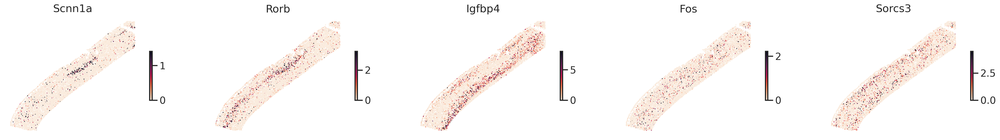

P28NR_pos


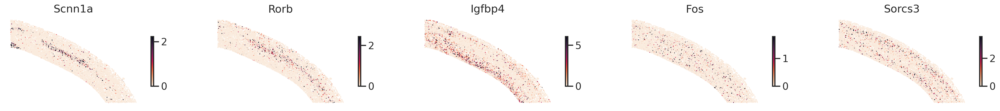

P28DR_ant


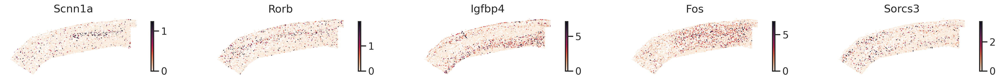

P28DR_pos


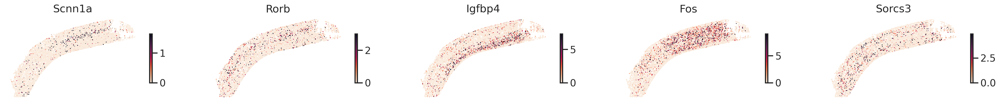

In [8]:
for name, adata in alldata.items():
    print(name)
    gns = ['Scnn1a', 'Rorb', 'Igfbp4', 'Fos', 'Sorcs3']
    x = adata.obs['x']
    y = adata.obs['y']
    n = len(gns)

    fig, axs = plt.subplots(1,n,figsize=(n*6,1*5))
    for ax, gn in zip(axs, gns):
        g = adata[:,gn].layers['norm']
        utils_merfish.st_scatter_ax(fig, ax, x, y, gexp=g, s=2, title=gn)
    plt.show()

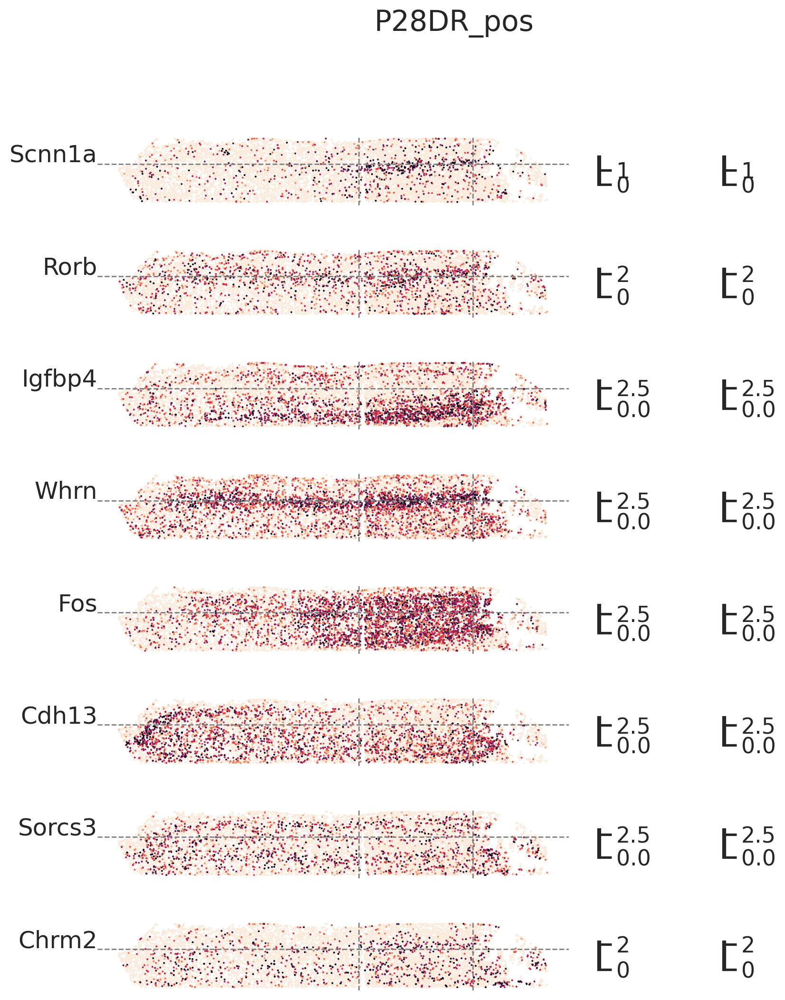

In [9]:
gns = ['Scnn1a', 'Rorb', 'Igfbp4', 'Whrn', 'Fos', 'Cdh13', 'Sorcs3', 'Chrm2',]# 'Astn2', 'Fos']

name = 'P28DR_pos' 
adata = alldata[name]
bound_l, bound_r, bound_d = adata.uns['bound_lrd']
x =  adata.obs['width']
y = -adata.obs['depth']
n = len(gns)

fig, axs = plt.subplots(n,1,figsize=(1*10,n*1.5))
fig.suptitle(name)
for ax, gn in zip(axs, gns):
    # gn = 'Scnn1a'
    g = np.log2(1+adata[:,gn].layers['norm']).reshape(-1,)
    
    vmax = np.percentile(g, 99)
    vmin = np.percentile(g,  5)
    cond = g > 1e-5
    
    utils_merfish.st_scatter_ax(fig, ax, x[~cond], y[~cond], gexp=g[~cond], s=2, title='', vmin=vmin, vmax=vmax, cmap='rocket_r') #, axis_off=False)
    utils_merfish.st_scatter_ax(fig, ax,  x[cond],  y[cond],  gexp=g[cond], s=2, title='', vmin=vmin, vmax=vmax, cmap='rocket_r') #, axis_off=False)
    
    ax.set_title(gn, loc='left', ha='right', y=0.5)
    ax.axhline(-bound_d, linestyle='--', linewidth=1, color='gray', zorder=2)
    ax.axvline( bound_l, linestyle='--', linewidth=1, color='gray', zorder=2)
    ax.axvline( bound_r, linestyle='--', linewidth=1, color='gray', zorder=2)
    # ax.grid(True)
    # ax.axis('on')
    
plt.show()

# do a clustering together
- abc genes

In [10]:
agenes = genesets['a']
bgenes = genesets['b']
cgenes = genesets['c']
iegs   = genesets['i']
up_agenes = genesets['a_up']
abcgenes = np.hstack([agenes, bgenes, cgenes])
len(abcgenes)

170

In [11]:
agenes_idx = basicu.get_index_from_array(adata.var.index.values, agenes)
bgenes_idx = basicu.get_index_from_array(adata.var.index.values, bgenes)
cgenes_idx = basicu.get_index_from_array(adata.var.index.values, cgenes)
igenes_idx = basicu.get_index_from_array(adata.var.index.values, iegs)

In [12]:
# lnorm
for name in names:
    adatasub = alldata[name]
    adatasub.layers['lnorm'] = np.log2(1+adatasub.layers['norm']) # .sum(axis=1)

In [13]:
# cluster V1 L2/3 only
adata_merged = []
for i, name in enumerate(names):
    adatasub = alldata[name].copy()
    # # select L2/3 only
    # adatasub = adatasub[adatasub.obs['depth'] < 400]
    if i == 0:
        genes = adatasub.var.index.values
    else:
        np.all(genes == adatasub.var.index.values)
        

    adatasub.obs.index = adatasub.obs.index + '_' + name
    adatasub.obs['sample'] = name
    adatasub.obs['depth_show'] = -adatasub.obs['depth'].values - i*1200 # name
    adatasub.obs['depth_show2'] = -adatasub.obs['depth'].values - i*500 # name
    adatasub.obs['width_show'] =  adatasub.obs['width'].values - np.min(adatasub.obs['width'].values)   # name
    
    
    l, r, d = adatasub.uns['bound_lrd']
    width = adatasub.obs['width'].values
    width_norm = (width-l)/np.abs(r-l)
    adatasub.obs['width_norm'] = width_norm
    
    
    
    adata_merged.append(adatasub)
    print(adatasub.shape)
    # break
    
adata_merged = ad.concat(adata_merged)
adata_merged_abcgenes = adata_merged[:,abcgenes].copy()

adata_merged, adata_merged_abcgenes

(20466, 500)
(25253, 500)
(10678, 500)
(17553, 500)


(AnnData object with n_obs × n_vars = 73950 × 500
     obs: 'EntityID', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'PolyT_raw', 'PolyT_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'gncov', 'gnnum', 'fpcov', 'x', 'y', 'depth', 'width', 'inside_v1l23', 'sample', 'depth_show', 'depth_show2', 'width_show', 'width_norm'
     obsm: 'blanks', 'pca'
     layers: 'norm', 'lnorm',
 AnnData object with n_obs × n_vars = 73950 × 170
     obs: 'EntityID', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'PolyT_raw', 'PolyT_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'gncov', 'gnnum', 'fpcov', 'x', 'y', 'depth', 'width', 'inside_v1l23', 'sample', 'depth_show', 'depth_show2', 'width_show', 'width_norm'
     obsm: 'blanks', 'pca'
     layers: 'norm', 'lnorm')

# visualize FISH

In [14]:
adata = adata_merged

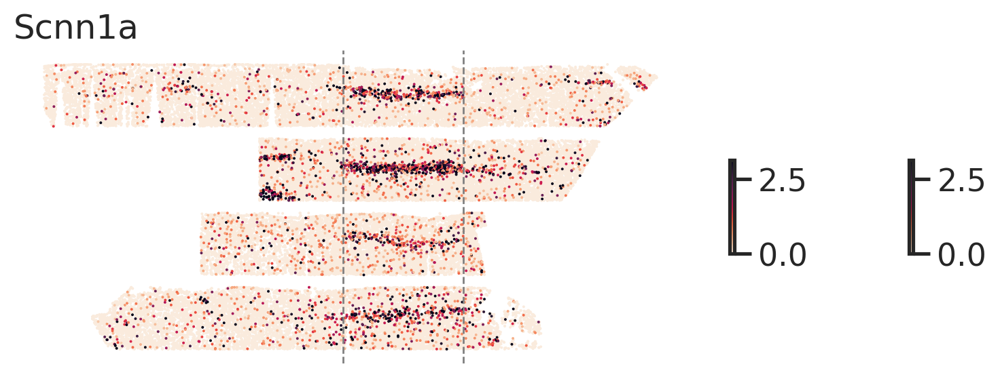

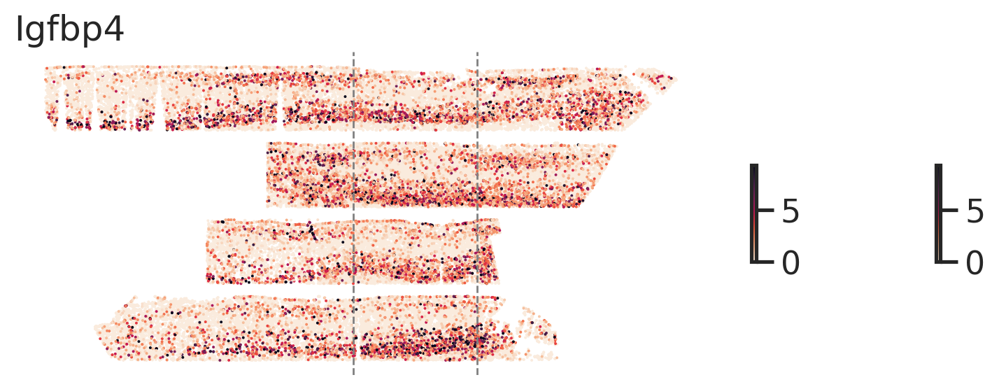

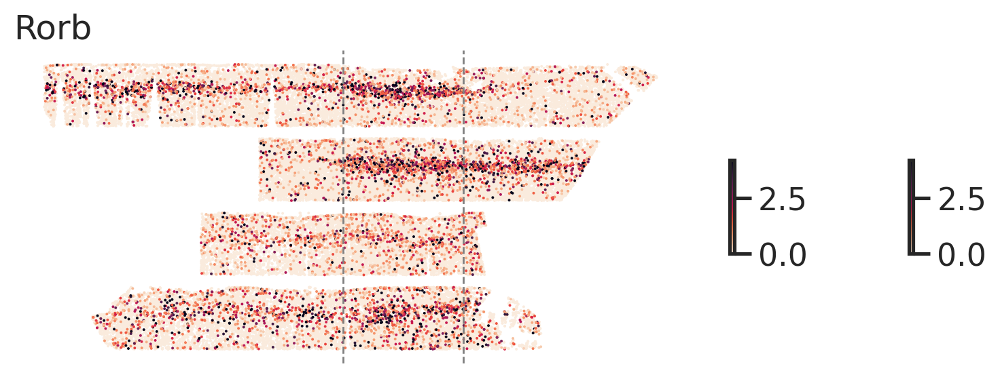

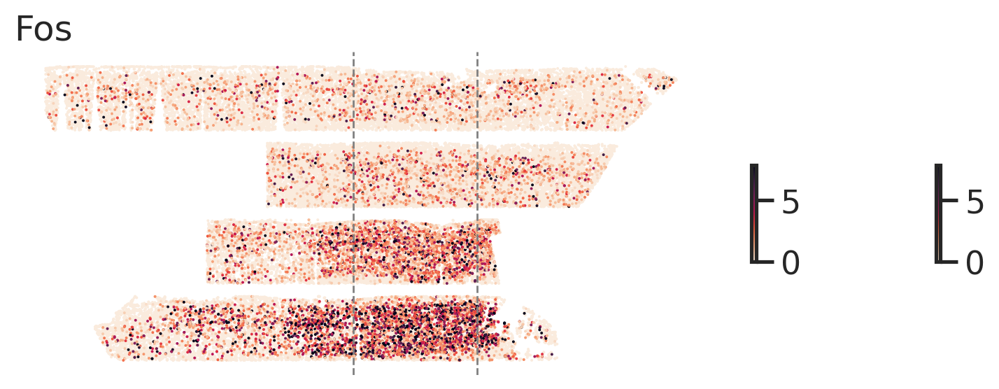

In [15]:
# check
gns = ['Scnn1a', 'Igfbp4', 'Rorb', 'Fos', ]
x =  adata.obs['width_norm']
y =  adata.obs['depth_show']
n = len(gns)

for gn in gns:
    fig, ax = plt.subplots(1,1,figsize=(1*10,1*3))
    g = adata[:,gn].layers['norm'].reshape(-1,)
    
    vmax = np.percentile(g, 99)
    vmin = np.percentile(g,  5)
    cond = g > 1e-5
    
    utils_merfish.st_scatter_ax(fig, ax, x[~cond], y[~cond], gexp=g[~cond], s=2, title='', vmin=vmin, vmax=vmax, cmap='rocket_r') #, axis_off=False)
    utils_merfish.st_scatter_ax(fig, ax,  x[cond],  y[cond],  gexp=g[cond], s=2, title='', vmin=vmin, vmax=vmax, cmap='rocket_r') #, axis_off=False)
    ax.set_title(gn, loc='left')
    ax.set_aspect('auto')
    ax.axvline(0, linewidth=1, color='gray', linestyle='--')
    ax.axvline(1, linewidth=1, color='gray', linestyle='--')
    
    # ax.grid(True)
    # ax.axis('on')
    
plt.show()

(27583,)
(27583,)
(27583,)
(27583,)


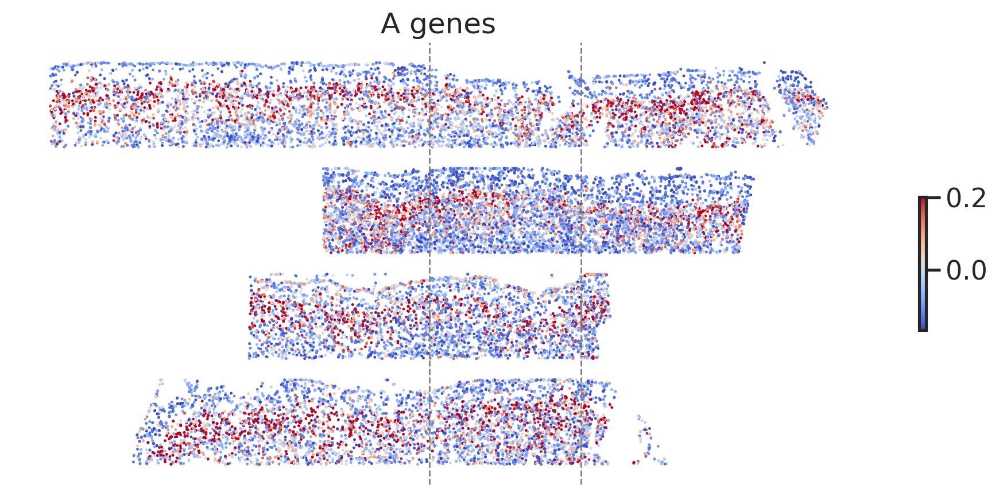

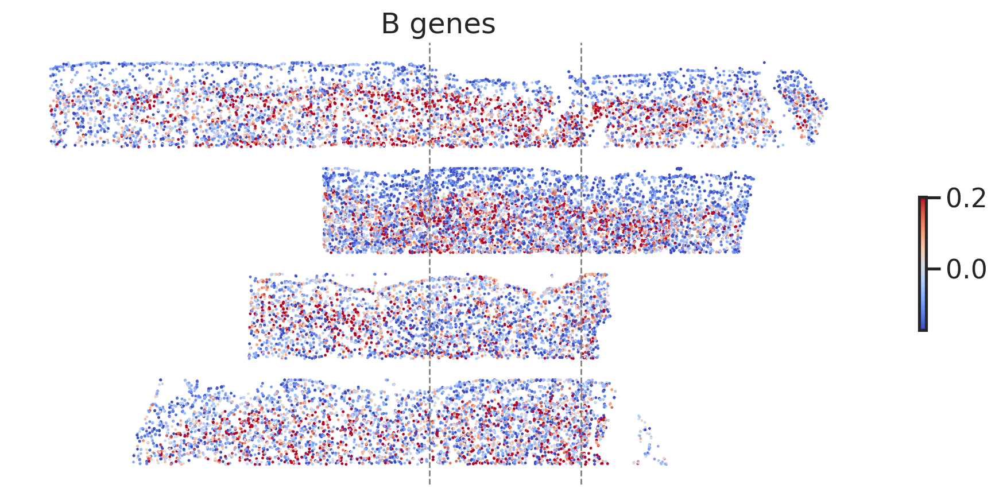

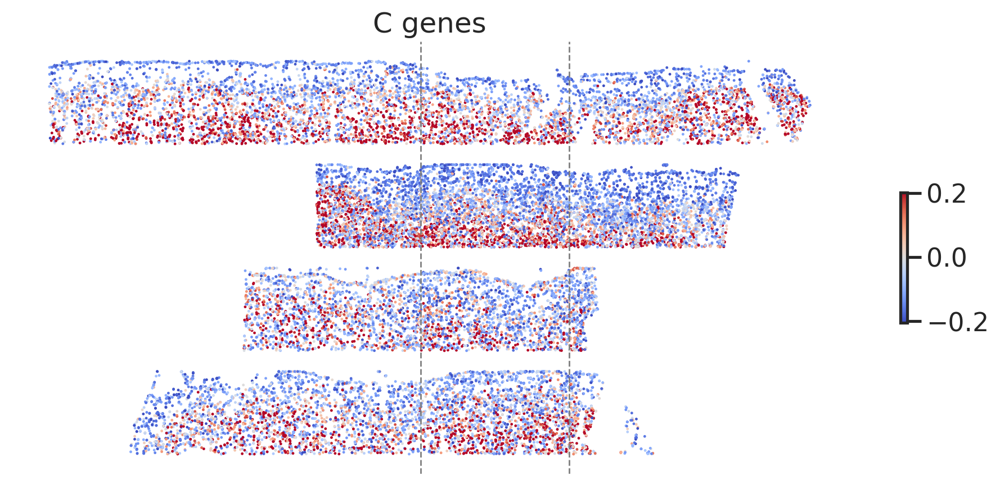

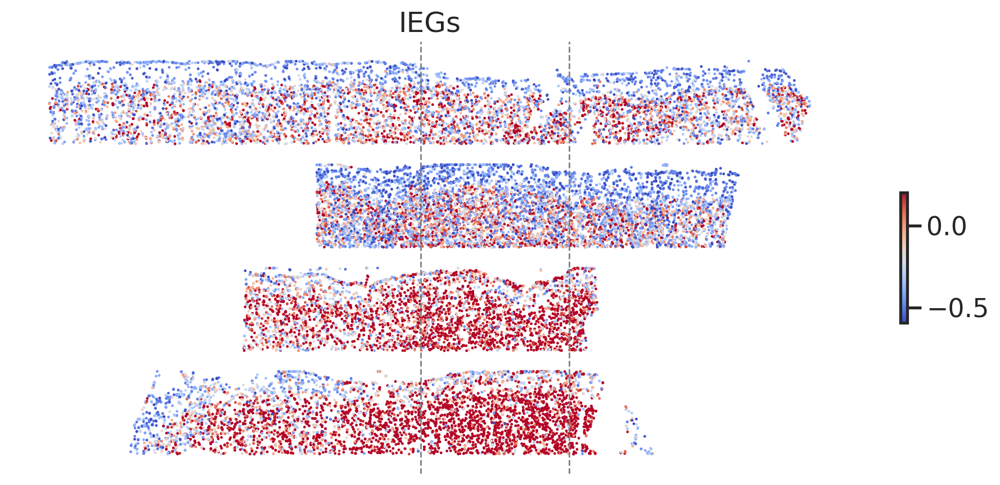

In [16]:
# check
gsets = [agenes, bgenes, cgenes, iegs]
titles = ['A genes', 'B genes', 'C genes', 'IEGs']
# gsets = [['Cdh13', 'Rfx3']]
adata_l23 = adata[adata.obs['depth'] < 400]

x =  adata_l23.obs['width_norm']
y =  adata_l23.obs['depth_show2']
n = len(gns)

for gset, title in zip(gsets, titles):
    
    mat = adata_l23[:,gset].layers['lnorm']
    baseline = mat.mean(axis=0) # .reshape(-1,)
    
    fig, ax = plt.subplots(1,1,figsize=(1*12,1*5))
    g = (mat-baseline).mean(axis=1) # .reshape(-1,)
    print(g.shape)

    utils_merfish.st_scatter_ax(fig, ax,  x,  y,  gexp=g, s=3, title=title, vmax=0.2, cmap='coolwarm') #, axis_off=False)
    
    ax.set_aspect('auto')
    ax.axvline(0, linewidth=1, color='gray', linestyle='--')
    ax.axvline(1, linewidth=1, color='gray', linestyle='--')
    
    # ax.grid(True)
    # ax.axis('on')
    
plt.show()

# stats

In [17]:
colors = [
    sns.color_palette('tab20c')[4],
    sns.color_palette('tab20c')[5],
    'k',
    'gray',
]

In [18]:
col_tobin = 'width_norm'
bins = np.arange(-1, 2+1e-3, 0.25)
midbins = np.mean(np.vstack([bins[:-1], bins[1:]]), axis=0)
print(bins)

stats = {}
for name in names:
    # adatasub = alldata[name]
    adatasub = adata[adata.obs['sample']==name]
    lnorm_mean, lnorm_sem, lnorm_std, n, binned, bins = binning_pipe2(adatasub, col_tobin, bins=bins)
    stats[name] = (lnorm_mean, lnorm_sem, lnorm_std, n, binned, bins)
    
binned.value_counts()

[-1.   -0.75 -0.5  -0.25  0.    0.25  0.5   0.75  1.    1.25  1.5   1.75
  2.  ]


(-1.0, -0.75]    1250
(-0.75, -0.5]    1083
(-0.5, -0.25]    1191
(-0.25, 0.0]     1157
(0.0, 0.25]      1474
(0.25, 0.5]      1735
(0.5, 0.75]      1900
(0.75, 1.0]      1719
(1.0, 1.25]      1284
(1.25, 1.5]       322
(1.5, 1.75]       263
(1.75, 2.0]         0
dtype: int64

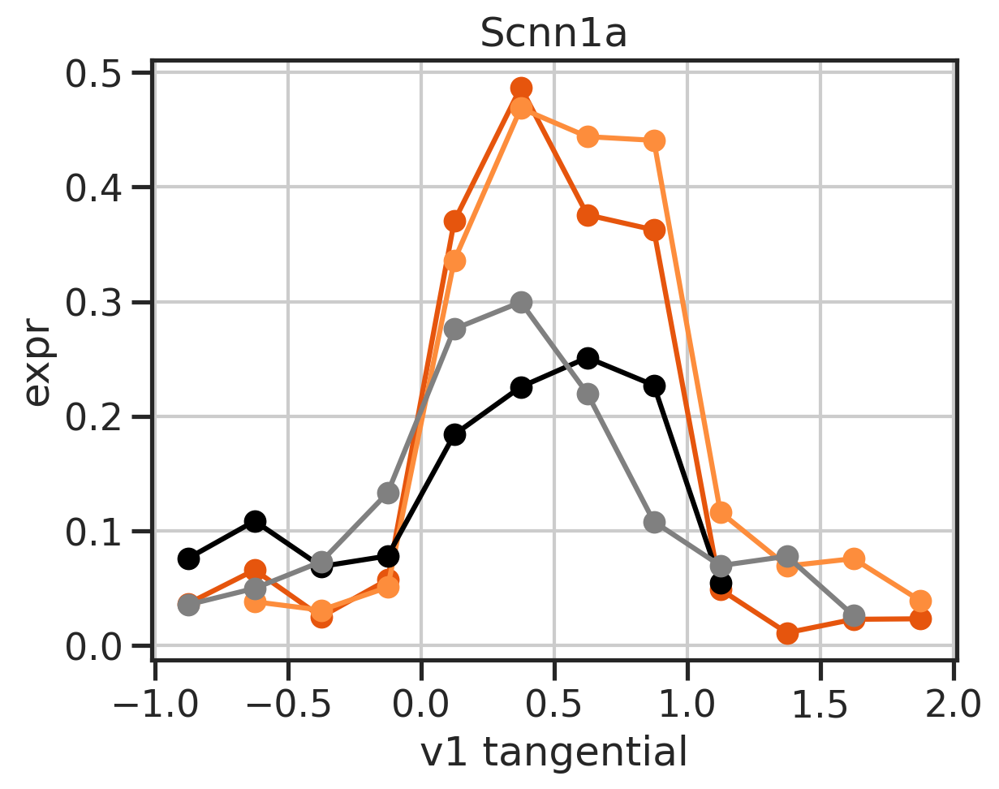

In [19]:
gn = 'Scnn1a'
for name, color in zip(names, colors):
    adatasub = adata[adata.obs['sample']==name]
    adatasub = adatasub[adatasub.obs['depth']<600]
    adatasub = adatasub[adatasub.obs['depth']>400]
    lnorm_mean, lnorm_sem, lnorm_std, n, binned, bins = binning_pipe2(adatasub, col_tobin, bins=bins)
    # (lnorm_mean, lnorm_sem, lnorm_std, n, binned, bins) = stats[name]
    plt.plot(midbins, lnorm_mean[gn], '-o', color=color)
    plt.title(gn)
    plt.xlabel('v1 tangential')
    plt.ylabel('expr')
plt.show()

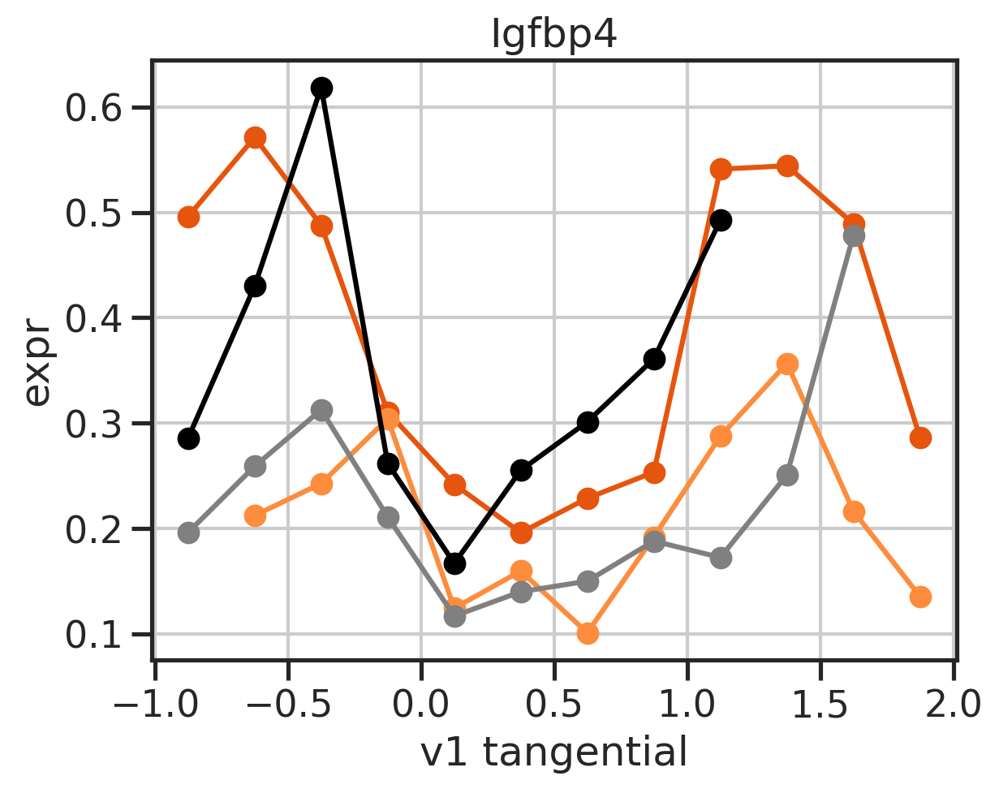

In [20]:
gn = 'Igfbp4'
for name, color in zip(names, colors):
    adatasub = adata[adata.obs['sample']==name]
    adatasub = adatasub[adatasub.obs['depth']<400]
    lnorm_mean, lnorm_sem, lnorm_std, n, binned, bins = binning_pipe2(adatasub, col_tobin, bins=bins)
    # (lnorm_mean, lnorm_sem, lnorm_std, n, binned, bins) = stats[name]
    # plt.plot(midbins, lnorm_mean[gn], '-o')
    plt.plot(midbins, lnorm_mean[gn], '-o', color=color)
    plt.title(gn)
    plt.xlabel('v1 tangential')
    plt.ylabel('expr')
plt.show()

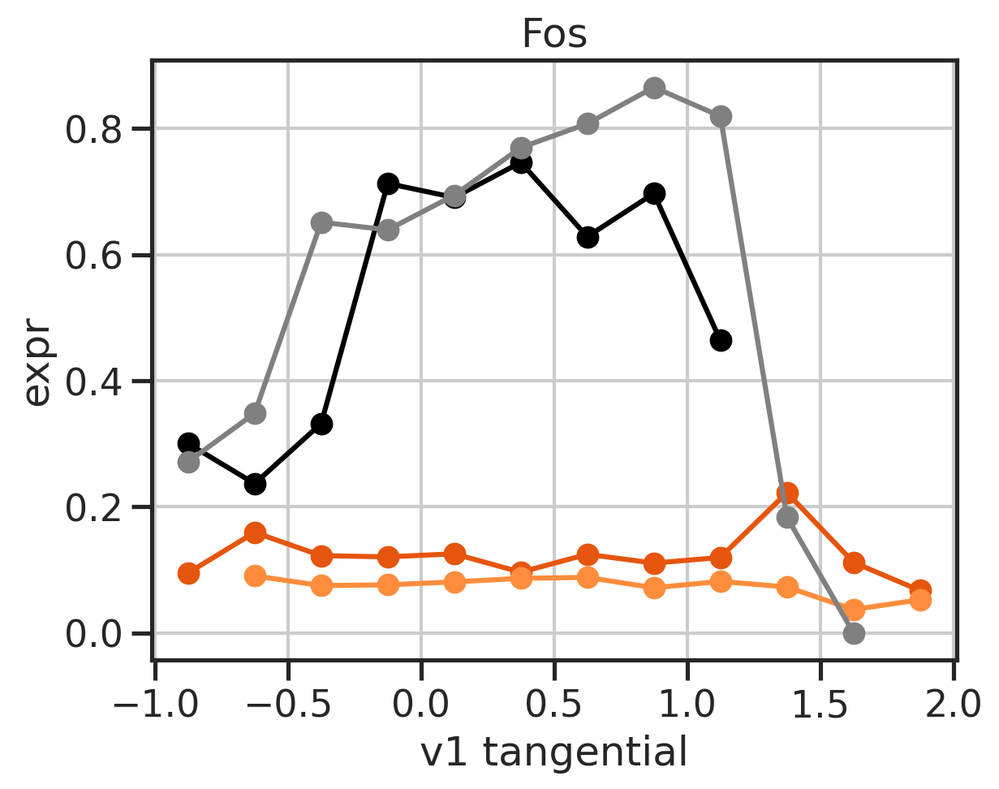

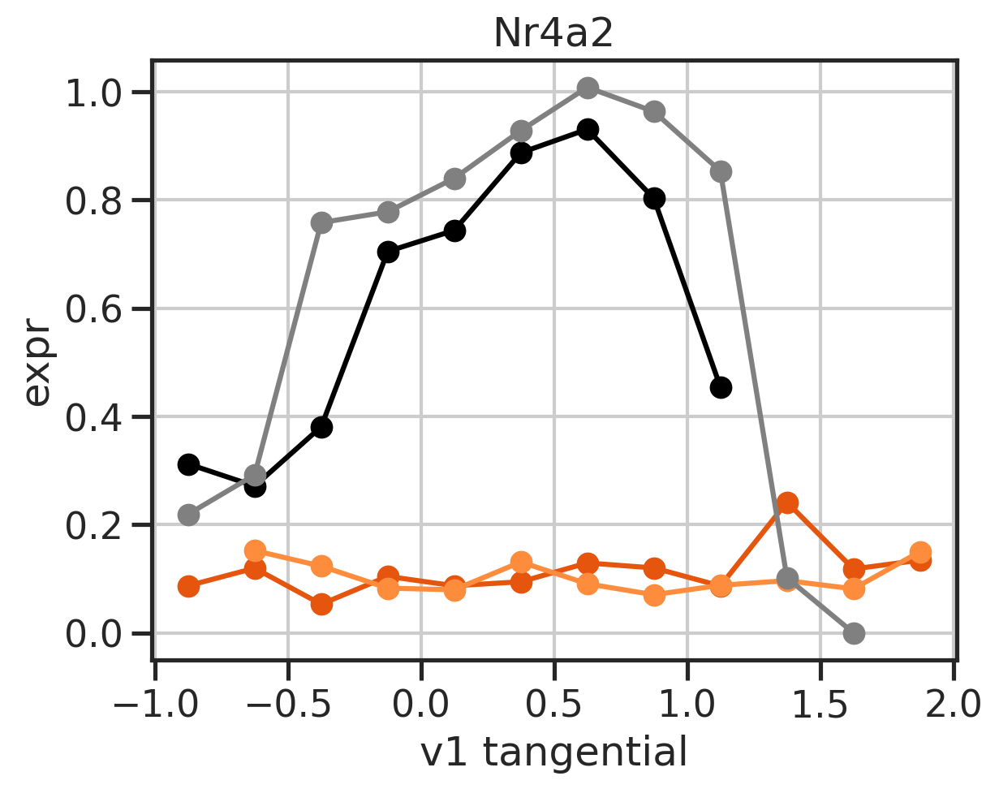

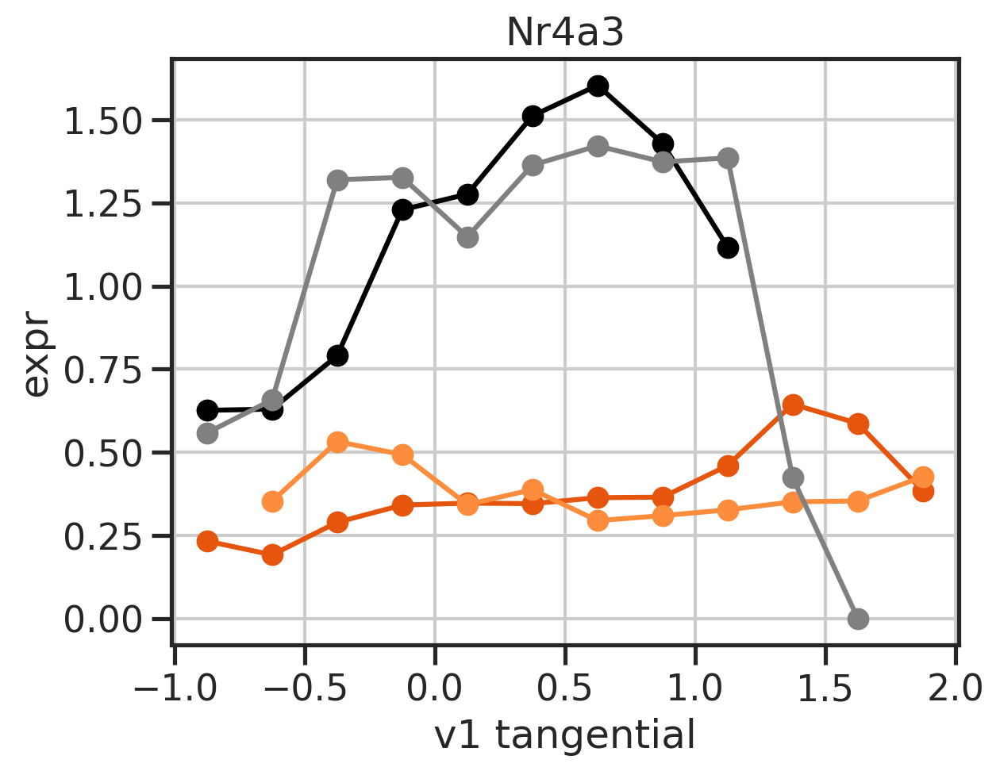

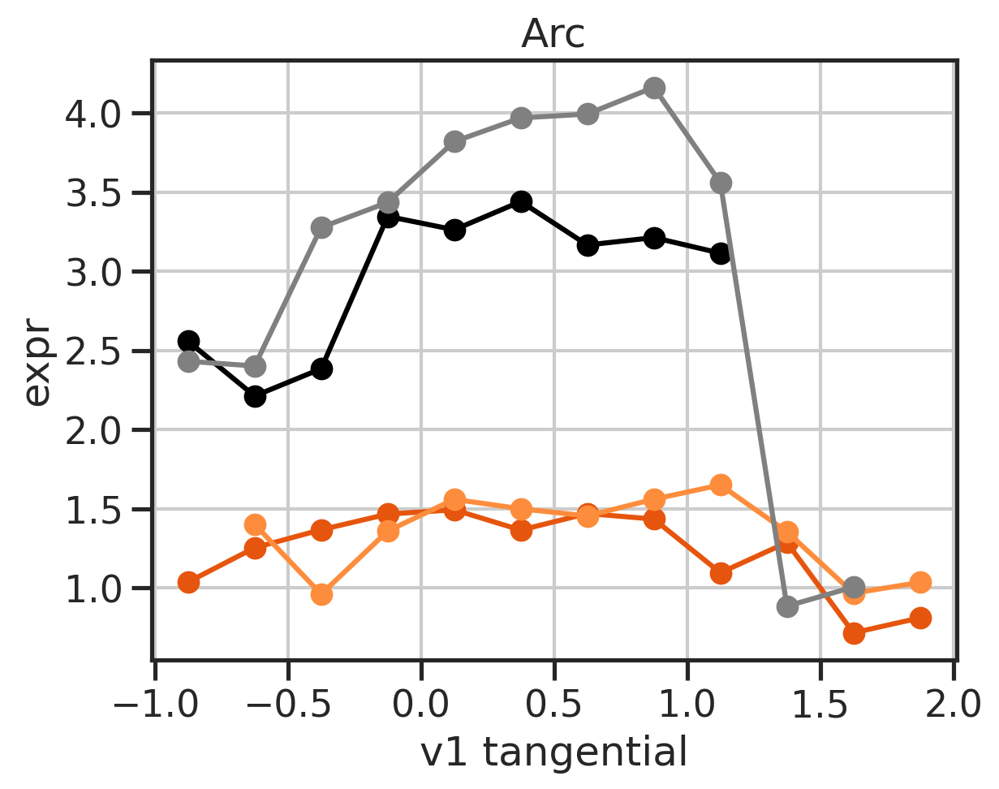

In [25]:
for gn in ['Fos', 'Nr4a2', 'Nr4a3', 'Arc']: #, 'Cdh13', 'Sorcs3', 'Chrm2']:
    for name, color in zip(names, colors):
        adatasub = adata[adata.obs['sample']==name]
        adatasub = adatasub[adatasub.obs['depth']<400]
        lnorm_mean, lnorm_sem, lnorm_std, n, binned, bins = binning_pipe2(adatasub, col_tobin, bins=bins)
        # (lnorm_mean, lnorm_sem, lnorm_std, n, binned, bins) = stats[name]
        plt.plot(midbins, lnorm_mean[gn], '-o', color=color)
        plt.title(gn)
        plt.xlabel('v1 tangential')
        plt.ylabel('expr')
    plt.show()